In [ ]:
!pip install tensorflow-io==0.23.1
!pip install tensorflow==2.8.0-rc0
!pip install kafka-python
!pip install yfinance --upgrade --no-cache-dir
!pip install pyspark
!wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
!tar -xzvf ta-lib-0.4.0-src.tar.gz
%cd ta-lib/
!./configure --prefix=/usr
!make
!make install
!pip install TA-Lib
%cd /content
#!curl -sSOL https://dlcdn.apache.org/kafka/3.1.0/kafka_2.13-3.1.0.tgz
!curl -sSOL https://archive.apache.org/dist/kafka/3.3.1/kafka_2.13-3.3.1.tgz
!tar -xzf kafka_2.13-3.3.1.tgz
#!tar -xzf kafka_2.13-3.1.0.tgz
!./kafka_2.13-3.3.1/bin/zookeeper-server-start.sh -daemon ./kafka_2.13-3.3.1/config/zookeeper.properties
!./kafka_2.13-3.3.1/bin/kafka-server-start.sh -daemon ./kafka_2.13-3.3.1/config/server.properties
!echo "Waiting for 10 secs until kafka and zookeeper services are up and running"
!sleep 10

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.4 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-io-gcs-filesystem
    Found existing installation: tensorflow-io-gcs-filesystem 0.35.0
    Uninstalling tensorflow-io-gcs-filesystem-0.35.0:
      Successfully uninstalled tensorflow-io-gcs-filesystem-0.35.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 492.2/492.2 MB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 952.8/952.8 kB 56.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 55.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.5/462.5 kB 40.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 65.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 60.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 246.5/246.5 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.4/72.4 kB 1.2 MB/s eta 0:00:00
  Attempting uninstall: yfinance
    Found existing installation: yfinance 0.2.35
    Uninstalling yfinance-0.2.35:
      Successfully uninstalled yfinance-0.2.35
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.9/316.9 MB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.5.0-py2.py3-none-any.whl size=317425361 sha256=5f6e6b9bbfa01297d43bc47bd827feaef310cd6ed713cb544e056aa77cb00d17
  Stored in directory: /root/.cache/pip/wheels/41/4e/10/c2cf2467f71c678cfc8a6b9ac9241e5e44a01940da8fbb17fc
Successfully built pyspark


In [ ]:
!./kafka_2.13-3.3.1/bin/kafka-topics.sh --create --bootstrap-server 127.0.0.1:9092 --replication-factor 1 --partitions 1 --BG1
!./kafka_2.13-3.3.1/bin/kafka-topics.sh --create --bootstrap-server 127.0.0.1:9092 --replication-factor 1 --partitions 2 --BG2

Exception in thread "main" joptsimple.UnrecognizedOptionException: BG1 is not a recognized option
	at joptsimple.OptionException.unrecognizedOption(OptionException.java:108)
	at joptsimple.OptionParser.handleLongOptionToken(OptionParser.java:510)
	at joptsimple.OptionParserState$2.handleArgument(OptionParserState.java:56)
	at joptsimple.OptionParser.parse(OptionParser.java:396)
	at kafka.admin.TopicCommand$TopicCommandOptions.<init>(TopicCommand.scala:567)
	at kafka.admin.TopicCommand$.main(TopicCommand.scala:47)
	at kafka.admin.TopicCommand.main(TopicCommand.scala)
Exception in thread "main" joptsimple.UnrecognizedOptionException: BG2 is not a recognized option
	at joptsimple.OptionException.unrecognizedOption(OptionException.java:108)
	at joptsimple.OptionParser.handleLongOptionToken(OptionParser.java:510)
	at joptsimple.OptionParserState$2.handleArgument(OptionParserState.java:56)
	at joptsimple.OptionParser.parse(OptionParser.java:396)
	at kafka.admin.TopicCommand$TopicCommandOptio

In [ ]:
!./kafka_2.13-3.3.1/bin/kafka-topics.sh --describe --bootstrap-server 127.0.0.1:9092 --BD1
!./kafka_2.13-3.3.1/bin/kafka-topics.sh --describe --bootstrap-server 127.0.0.1:9092 --BD2

Exception in thread "main" joptsimple.UnrecognizedOptionException: BD1 is not a recognized option
	at joptsimple.OptionException.unrecognizedOption(OptionException.java:108)
	at joptsimple.OptionParser.handleLongOptionToken(OptionParser.java:510)
	at joptsimple.OptionParserState$2.handleArgument(OptionParserState.java:56)
	at joptsimple.OptionParser.parse(OptionParser.java:396)
	at kafka.admin.TopicCommand$TopicCommandOptions.<init>(TopicCommand.scala:567)
	at kafka.admin.TopicCommand$.main(TopicCommand.scala:47)
	at kafka.admin.TopicCommand.main(TopicCommand.scala)
Exception in thread "main" joptsimple.UnrecognizedOptionException: BD2 is not a recognized option
	at joptsimple.OptionException.unrecognizedOption(OptionException.java:108)
	at joptsimple.OptionParser.handleLongOptionToken(OptionParser.java:510)
	at joptsimple.OptionParserState$2.handleArgument(OptionParserState.java:56)
	at joptsimple.OptionParser.parse(OptionParser.java:396)
	at kafka.admin.TopicCommand$TopicCommandOptio

In [ ]:
import os
from datetime import datetime
import time
import threading
import json
from kafka import KafkaProducer
from kafka.errors import KafkaError
from sklearn.model_selection import train_test_split
from pyspark.sql import SparkSession
import pandas as pd
import tensorflow as tf
import tensorflow_io as tfio
import requests
import yfinance as yf
from sklearn.preprocessing import MinMaxScaler
import talib

/usr/local/lib/python3.10/dist-packages/yfinance/base.py:48: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  _empty_series = pd.Series()


In [ ]:
data = yf.download(tickers=[ "PYPL","GOOGL", "MSFT", "AMZN", "TSLA", "META", "NFLX",
                 "JPM", "V", "GS", "INTC", "CSCO", "IBM", "WMT","PG", "KO", "PEP", "AAPL",
                 "MRK", "JNJ", "PFE", "UNH", "AMGN","CVX", "XOM", "COP", "SLB", "BP", "AAP",
                 "T", "VZ","DIS", "CMCSA","DWAC",	"ADM", "UAL", "GILD", "RUM","PHUN","WDC",
                 "VRM","OLVI","SGMT","NS","FSR", "UPST", "PLTR","WELL","SOFI","DAL","ZION",
                 "DIS","RVSN","BA", "MMM", "CAT", "GE", "HON", "WBA", "MCD", "NKE", "SBUX",
                 "GM", "F", "TGT", "COST", "WMT", "HD", "LOW", "CVS","KO", "PEP", "MNST",
                 "PM", "MO", "TJX", "ORLY", "MGM", "LVS" ], period='1d', interval='1m', group_by='ticker')
print(type(data))
print(len(data))
print(len(data.columns))
print(data)

[*********************100%%**********************]  75 of 75 completed

<class 'pandas.core.frame.DataFrame'>
390
450
Ticker                           ADM                                   \
Price                           Open       High        Low      Close   
Datetime                                                                
2024-01-22 09:30:00-05:00  56.880001  57.000000  56.150002  56.275002   
2024-01-22 09:31:00-05:00  56.230000  56.820000  55.770000  56.618698   
2024-01-22 09:32:00-05:00  56.619999  57.759998  56.299999  56.959999   
2024-01-22 09:33:00-05:00  56.980000  57.220001  56.410000  56.990002   
2024-01-22 09:34:00-05:00  56.974998  57.149899  56.790001  56.790001   
...                              ...        ...        ...        ...   
2024-01-22 15:55:00-05:00  52.185001  52.197399  52.009998  52.009998   
2024-01-22 15:56:00-05:00  52.009998  52.090000  51.889999  51.895000   
2024-01-22 15:57:00-05:00  51.889999  51.895000  51.799999  51.810001   
2024-01-22 15:58:00-05:00  51.810001  51.830002  51.700001  51.720001   
2024-

In [ ]:
pip install pyspark

In [ ]:
from pyspark.sql import SparkSession
spark = SparkSession.builder.appName("Big_Data_Project").getOrCreate()



In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math


In [ ]:
pip install yfinance


In [ ]:
import yfinance as yf
import pandas as pd

stock_symbols =[ "PYPL","GOOGL", "MSFT", "AMZN", "TSLA", "META", "NFLX",
                 "JPM", "V", "GS", "INTC", "CSCO", "IBM", "WMT","PG", "KO", "PEP", "AAPL",
                 "MRK", "JNJ", "PFE", "UNH", "AMGN","CVX", "XOM", "COP", "SLB", "BP", "AAP",
                 "T", "VZ","DIS", "CMCSA","DWAC",	"ADM", "UAL", "GILD", "RUM","PHUN","WDC",
                 "VRM","OLVI","SGMT","NS","FSR", "UPST", "PLTR","WELL","SOFI","DAL","ZION",
                 "DIS","RVSN","BA", "MMM", "CAT", "GE", "HON", "WBA", "MCD", "NKE", "SBUX",
                 "GM", "F", "TGT", "COST", "WMT", "HD", "LOW", "CVS","KO", "PEP", "MNST",
                 "PM", "MO", "TJX", "ORLY", "MGM", "LVS" ]

stock_data = pd.DataFrame()

stock_tables = {}

for symbol in stock_symbols:
    stock = yf.download(symbol, start="2023-01-01", end="2024-01-01")
    stock['Symbol'] = symbol
    stock_data = pd.concat([stock_data, stock], axis=0)

    stock_tables[symbol] = stock

print(stock_data.head())


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

                 Open       High        Low      Close  Adj Close    Volume  \
Date                                                                          
2023-01-03  73.690002  75.260002  73.379997  74.580002  74.580002  27974200   
2023-01-04  76.110001  78.480003  75.430000  77.690002  77.690002  19144700   
2023-01-05  77.300003  77.320000  75.650002  76.269997  76.269997  11113800   
2023-01-06  76.769997  77.059998  73.949997  76.480003  76.480003  14167900   
2023-01-09  77.000000  78.764999  76.529999  77.080002  77.080002  12966100   

           Symbol  
Date               
2023-01-03   PYPL  
2023-01-04   PYPL  
2023-01-05   PYPL  
2023-01-06   PYPL  
2023-01-09   PYPL  


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


62.79191272237487 PYPL
39.17479038164489 GOOGL


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


28.48665485033829 MSFT
49.86571264098898 AMZN


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


67.80309378437714 TSLA
64.42802226421134 META


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


51.3085959585637 NFLX


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


16.11409633959921 JPM


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


4.48694813071069 V


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


11.727505171513496 GS


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


48.828655325531415 INTC


[*********************100%%**********************]  1 of 1 completed


24.26073412725126 CSCO


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


1.5347268846299913 WMT


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


6.265078069055904 PG


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


26.935842468685507 AAPL


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


12.4102535410824 PFE


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

38.900432533153655 AAP


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


1.6350236125463435 T


[*********************100%%**********************]  1 of 1 completed


24.332625779148444 VZ


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


44.246938180999216 DIS


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


30.032009721906427 CMCSA
70.81712148890153 DWAC


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


15.603308018157517 UAL


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


46.007263501760406 RUM
70.83018965702455 PHUN


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


52.01521028583947 WDC
90.7356951887175 VRM


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


44.444445824181535 OLVI


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGMT']: Exception("%ticker%: Data doesn't exist for startDate = 1641013200, endDate = 1641272400")
[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['SGMT']: Exception("%ticker%: Data doesn't exist for startDate = 1672376400, endDate = 1672462800")
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


55.26153857891376 FSR
91.39434924669536 UPST


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


65.03268048545553 PLTR


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


23.92061250505173 WELL
71.36645947648375 SOFI


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


17.416436656756826 DAL


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


23.043207536905314 ZION
44.246938180999216 DIS


[*********************100%%**********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['RVSN']: Exception("%ticker%: Data doesn't exist for startDate = 1641013200, endDate = 1641272400")
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


6.622546326880362 BA


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


32.75011594693994 MMM


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


12.003777924391425 GE


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


28.511286241358807 WBA


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


2.2115817548157284 MCD


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


30.15579120824873 NKE


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


14.827856178807275 SBUX


[*********************100%%**********************]  1 of 1 completed


43.81159179922267 GM


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


45.32205047416489 F


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


35.500069865401464 TGT


[*********************100%%**********************]  1 of 1 completed


19.207833861844488 COST


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


1.5347268846299913 WMT


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


24.176013683643113 HD


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


23.132717550173272 LOW


[*********************100%%**********************]  1 of 1 completed


9.357061906070804 CVS


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


3.504327390420866 MO


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


25.555066390468134 MGM


[*********************100%%**********************]  1 of 1 completed


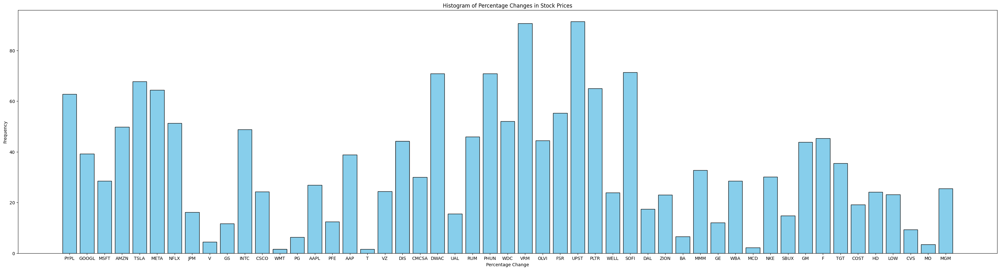

In [ ]:
import yfinance as yf
import matplotlib.pyplot as plt
import pandas as pd

# Define a list of stock symbols
stocks = [ "PYPL","GOOGL", "MSFT", "AMZN", "TSLA", "META", "NFLX",
                 "JPM", "V", "GS", "INTC", "CSCO", "IBM", "WMT","PG", "KO", "PEP", "AAPL",
                 "MRK", "JNJ", "PFE", "UNH", "AMGN","CVX", "XOM", "COP", "SLB", "BP", "AAP",
                 "T", "VZ","DIS", "CMCSA","DWAC",	"ADM", "UAL", "GILD", "RUM","PHUN","WDC",
                 "VRM","OLVI","SGMT","NS","FSR", "UPST", "PLTR","WELL","SOFI","DAL","ZION",
                 "DIS","RVSN","BA", "MMM", "CAT", "GE", "HON", "WBA", "MCD", "NKE", "SBUX",
                 "GM", "F", "TGT", "COST", "WMT", "HD", "LOW", "CVS","KO", "PEP", "MNST",
                 "PM", "MO", "TJX", "ORLY", "MGM", "LVS" ]
# Create a list to store the percentage changes
percentage_changes = []
Stock=[]

# Fetch historical stock data and calculate percentage changes
for stock in stocks:
    #data = yf.download(stock, start="2022-01-01", end="2022-12-31", interval='1mo')
    #print(data)
    open_price=pd.DataFrame(yf.download(stock, start="2022-01-01", end="2022-01-04"),index=pd.to_datetime(['2022-01-03']))
    OpenP=open_price['Open']
    Open=float(OpenP.iloc[0])
    close_price=pd.DataFrame(yf.download(stock, start="2022-12-30", end="2022-12-31"),index=pd.to_datetime(['2022-12-30']))
    CloseP=close_price['Close']
    Close=float(CloseP.iloc[0])
    percentage_change = ((Open - Close) / Open) * 100
    if percentage_change>0:
        Stock.append(stock)
        percentage_changes.append(percentage_change)
        print(percentage_change, stock)
# Fetch weekly data for each stock
#for symbol in stocks:
 #   stock_data_weekly[symbol] = yf.download(symbol, start=start_date, end=end_date, interval='1wk')


# Plot histogram chart
plt.figure(figsize=(40,10))
plt.bar(Stock,height=percentage_changes, color='skyblue', edgecolor='black')

# Add labels and title
plt.xlabel('Percentage Change')
plt.ylabel('Frequency')
plt.title('Histogram of Percentage Changes in Stock Prices')

# Show the plot
plt.show()


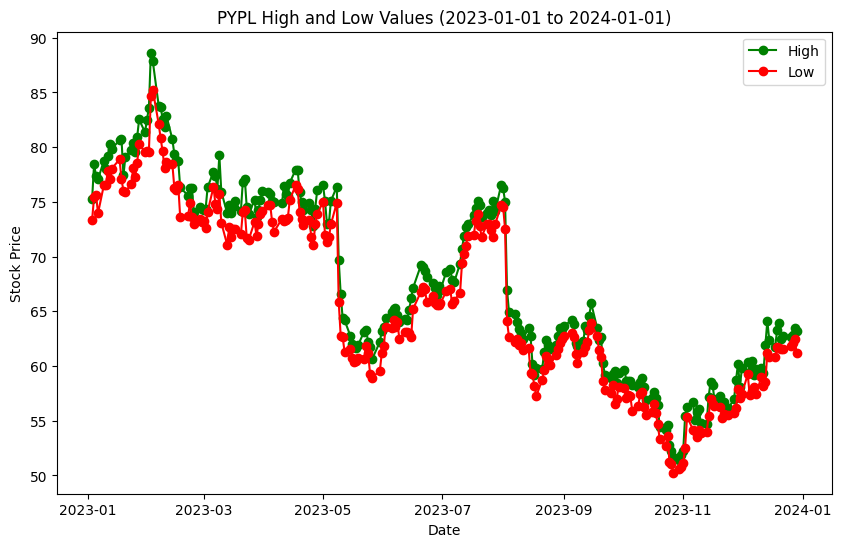

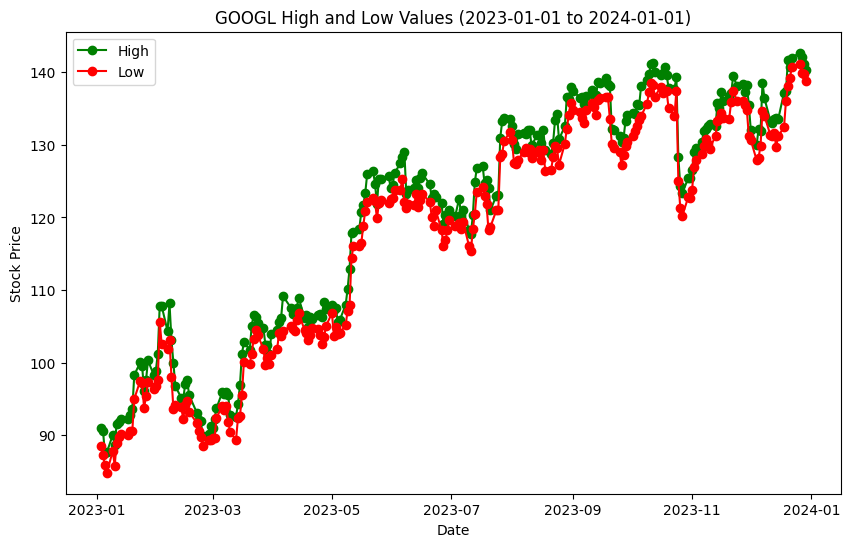

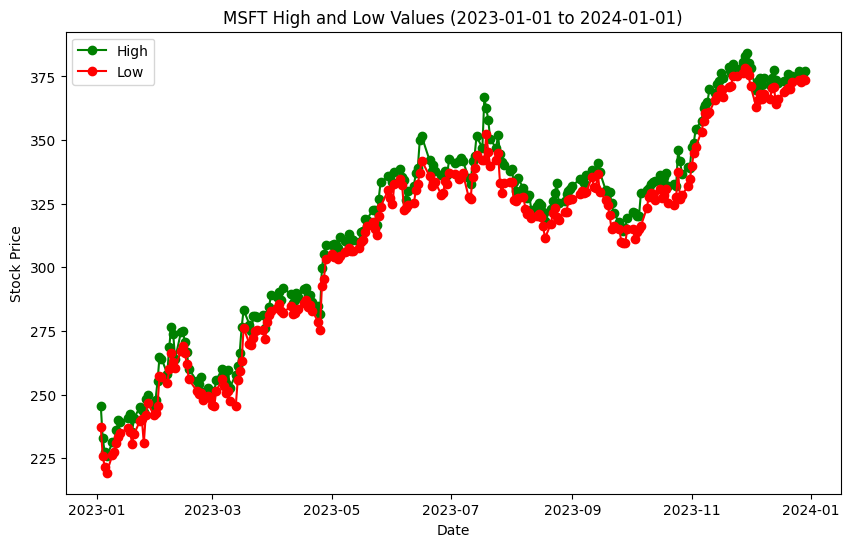

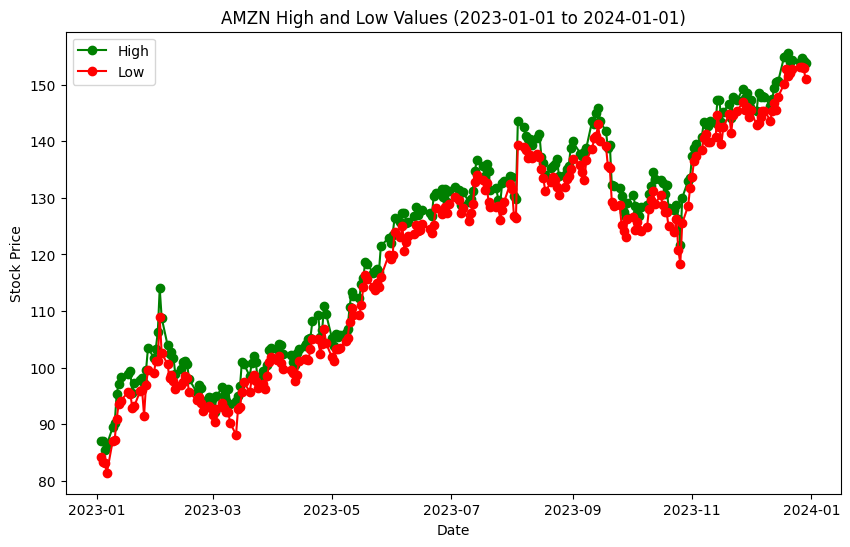

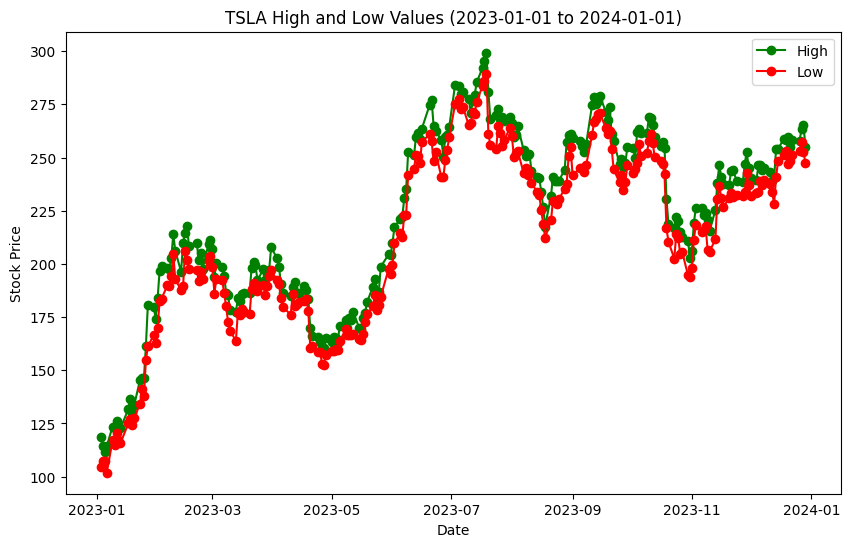

...

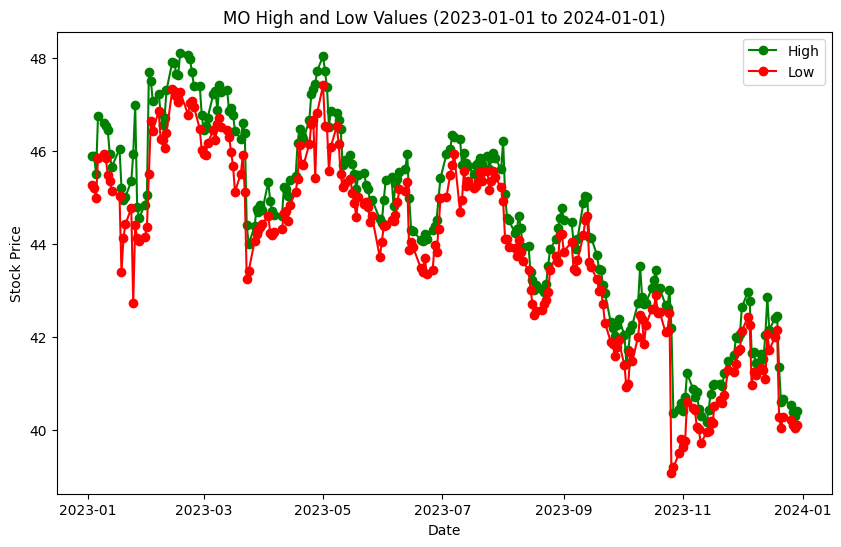

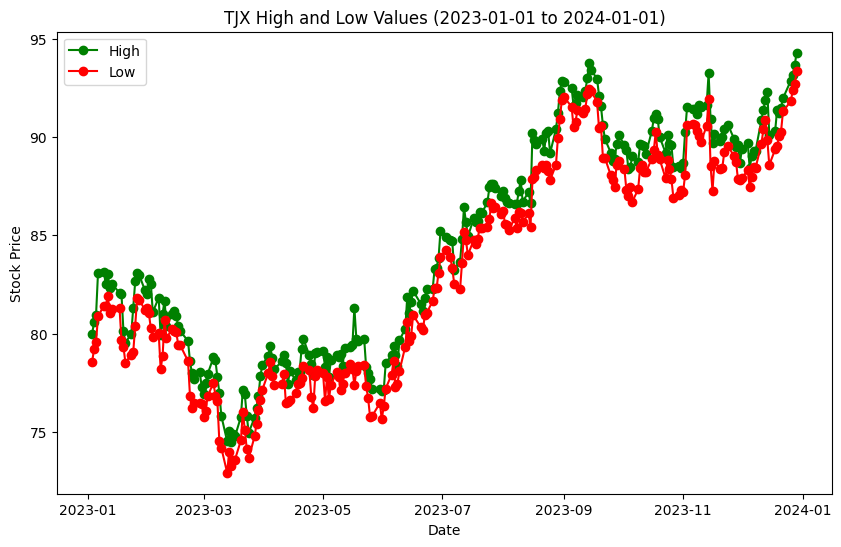

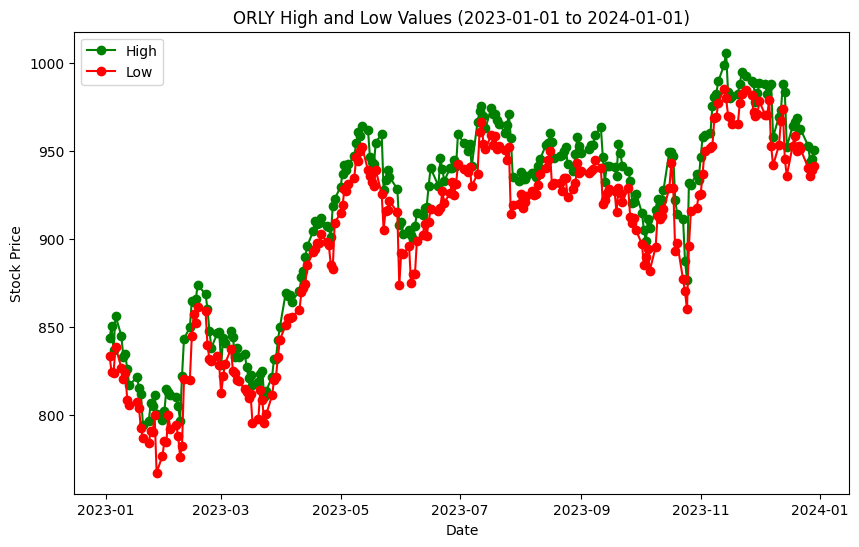

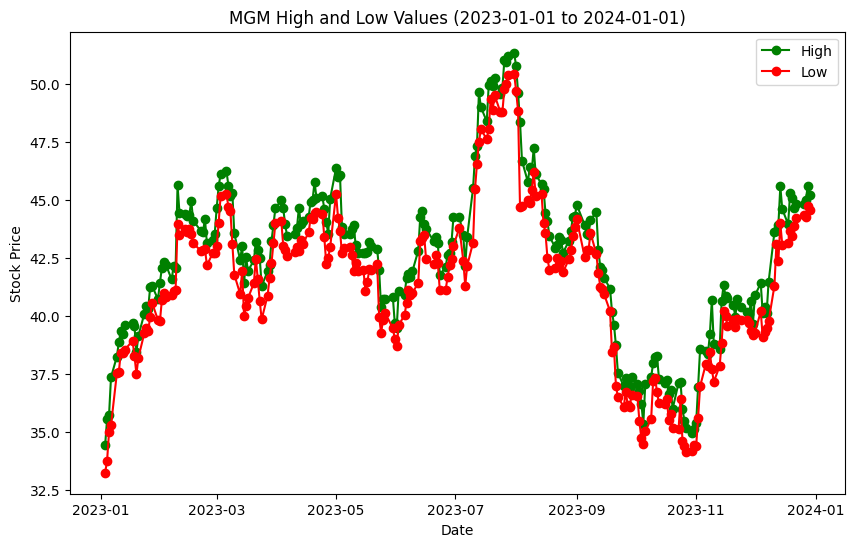

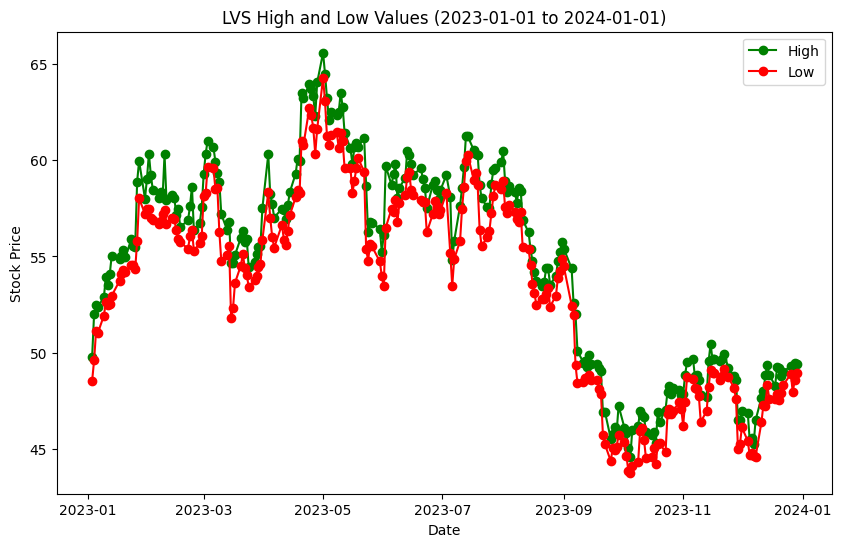

In [ ]:
for symbol, stock_df in stock_tables.items():
    plt.figure(figsize=(10, 6))
    plt.plot(stock_df.index, stock_df['High'], label='High', marker='o',color='green')
    plt.plot(stock_df.index, stock_df['Low'], label='Low', marker='o',color='red')
    plt.title(f"{symbol} High and Low Values (2023-01-01 to 2024-01-01)")
    plt.xlabel("Date")
    plt.ylabel("Stock Price")
    plt.legend()
    plt.show()

Top 10 Most Profitable Stocks:
OLVI: 1500.00%
UPST: 216.99%
META: 183.76%
PLTR: 168.70%
TSLA: 129.86%
SOFI: 121.11%
GE: 92.39%
INTC: 87.99%
AMZN: 77.04%
WDC: 66.73%


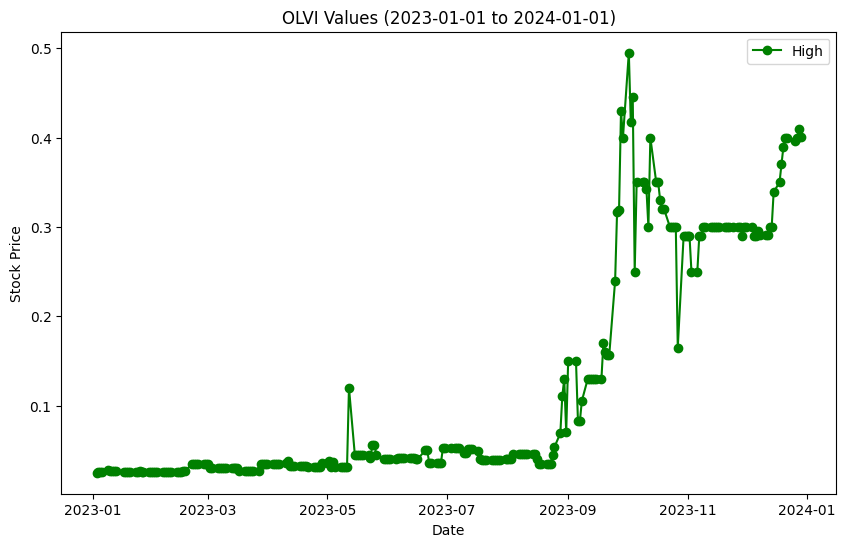

In [ ]:
profitability = {}
for symbol, stock_df in stock_tables.items():
    start_price = stock_df['Close'].iloc[0]
    end_price = stock_df['Close'].iloc[-1]
    percentage_change = ((end_price - start_price) / start_price) * 100
    profitability[symbol] = percentage_change

top_10_profitable = sorted(profitability.items(), key=lambda x: x[1], reverse=True)[:10]

print("Top 10 Most Profitable Stocks:")
for symbol, percentage_change in top_10_profitable:
    print(f"{symbol}: {percentage_change:.2f}%")

most_profitable_stock = top_10_profitable[0][0]
plt.figure(figsize=(10, 6))
plt.plot(stock_tables[most_profitable_stock].index, stock_tables[most_profitable_stock]['High'], label='High', marker='o',color='green')
plt.title(f"{most_profitable_stock} Values (2023-01-01 to 2024-01-01)")
plt.xlabel("Date")
plt.ylabel("Stock Price")
plt.legend()
plt.show()

Top 10 Stocks with Highest Losses:
PHUN: -89.88%
RVSN: -83.43%
FSR: -74.56%
SGMT: -66.02%
AAP: -59.73%
PFE: -43.84%
VRM: -37.19%
WBA: -29.79%
RUM: -28.50%
ADM: -19.44%


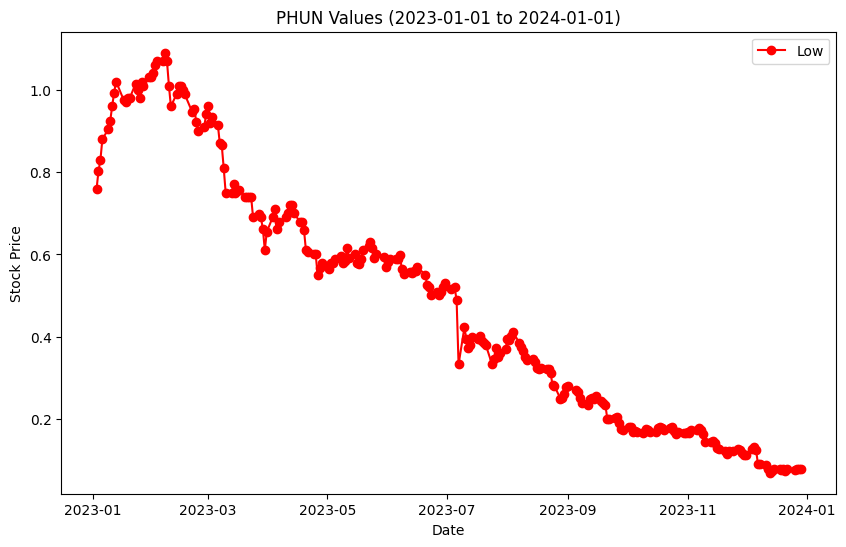

In [ ]:
losses = {}
for symbol, stock_df in stock_tables.items():
    start_price = stock_df['Close'].iloc[0]
    end_price = stock_df['Close'].iloc[-1]
    percentage_change = ((end_price - start_price) / start_price) * 100
    losses[symbol] = percentage_change

top_10_losses = sorted(losses.items(), key=lambda x: x[1])[:10]

print("Top 10 Stocks with Highest Losses:")
for symbol, percentage_change in top_10_losses:
    print(f"{symbol}: {percentage_change:.2f}%")

highest_loss_stock = top_10_losses[0][0]
plt.figure(figsize=(10, 6))

plt.plot(stock_tables[highest_loss_stock].index, stock_tables[highest_loss_stock]['Low'], label='Low', marker='o',color='red')
plt.title(f"{highest_loss_stock} Values (2023-01-01 to 2024-01-01)")
plt.xlabel("Date")
plt.ylabel("Stock Price")
plt.legend()
plt.show()

Top 10 Most Profitable Stocks (Profit-to-Risk Ratio):
GE: 0.1803
META: 0.1791
AAPL: 0.1460
COST: 0.1414
OLVI: 0.1365
MSFT: 0.1246
AMZN: 0.1207
INTC: 0.1205
TSLA: 0.1174
PLTR: 0.1119


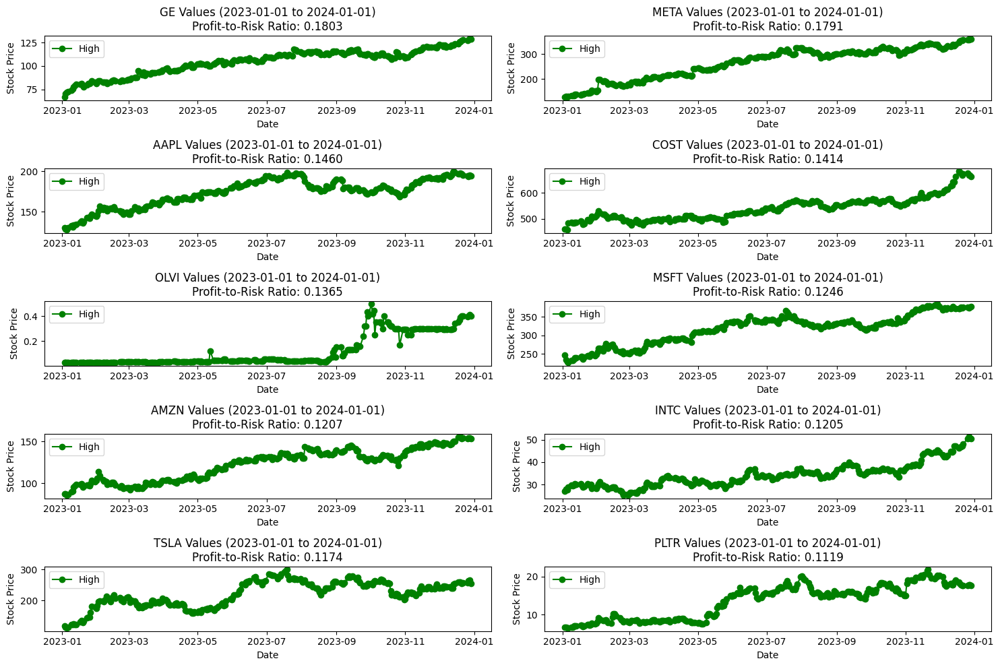

In [ ]:
returns = pd.DataFrame()
for symbol, stock_df in stock_tables.items():
    returns[symbol] = stock_df['Adj Close'].pct_change()

profit_to_risk_ratios = {}
for symbol in stock_symbols:
    mean_return = returns[symbol].mean()
    std_dev = returns[symbol].std()
    profit_to_risk_ratio = mean_return / std_dev
    profit_to_risk_ratios[symbol] = profit_to_risk_ratio

top_10_profitable_separability = sorted(profit_to_risk_ratios.items(), key=lambda x: x[1], reverse=True)[:10]

print("Top 10 Most Profitable Stocks (Profit-to-Risk Ratio):")
for symbol, ratio in top_10_profitable_separability:
    print(f"{symbol}: {ratio:.4f}")

plt.figure(figsize=(15, 10))

for i, (symbol, ratio) in enumerate(top_10_profitable_separability):
    plt.subplot(5, 2, i+1)
    plt.plot(stock_tables[symbol].index, stock_tables[symbol]['High'], label='High', marker='o',color='green')
    plt.title(f"{symbol} Values (2023-01-01 to 2024-01-01)\nProfit-to-Risk Ratio: {ratio:.4f}")
    plt.xlabel("Date")
    plt.ylabel("Stock Price")
    plt.legend()

plt.tight_layout()
plt.show()

Top 10 Stocks with Highest Losses (Profit-to-Risk Ratio):
PHUN: -0.1609
PFE: -0.1401
AAP: -0.0910
SGMT: -0.0883
RVSN: -0.0706
FSR: -0.0649
ADM: -0.0488
WBA: -0.0433
JNJ: -0.0327
CVS: -0.0263


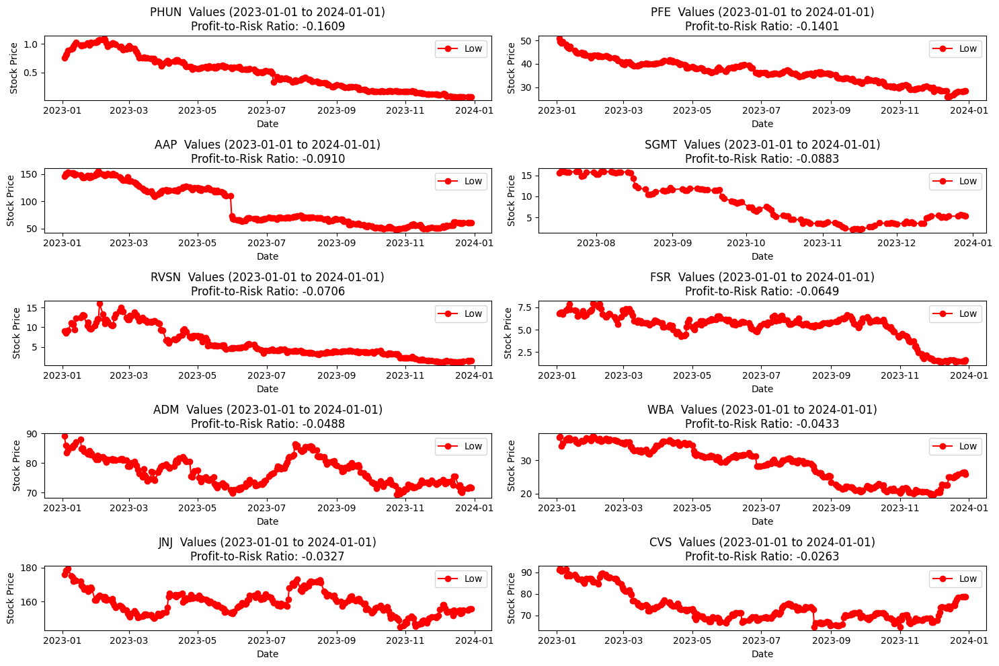

In [ ]:
returns = pd.DataFrame()
for symbol, stock_df in stock_tables.items():
    returns[symbol] = stock_df['Adj Close'].pct_change()

profit_to_risk_ratios = {}
for symbol in stock_symbols:
    mean_return = returns[symbol].mean()
    std_dev = returns[symbol].std()
    profit_to_risk_ratio = mean_return / std_dev
    profit_to_risk_ratios[symbol] = profit_to_risk_ratio

top_10_losses_separability = sorted(profit_to_risk_ratios.items(), key=lambda x: x[1])[:10]

print("Top 10 Stocks with Highest Losses (Profit-to-Risk Ratio):")
for symbol, ratio in top_10_losses_separability:
    print(f"{symbol}: {ratio:.4f}")

plt.figure(figsize=(15, 10))

for i, (symbol, ratio) in enumerate(top_10_losses_separability):
    plt.subplot(5, 2, i+1)
    plt.plot(stock_tables[symbol].index, stock_tables[symbol]['Low'], label='Low', marker='o', color="red")
    plt.title(f"{symbol}  Values (2023-01-01 to 2024-01-01)\nProfit-to-Risk Ratio: {ratio:.4f}")
    plt.xlabel("Date")
    plt.ylabel("Stock Price")
    plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
pip install networkx


In [ ]:
pip install seaborn

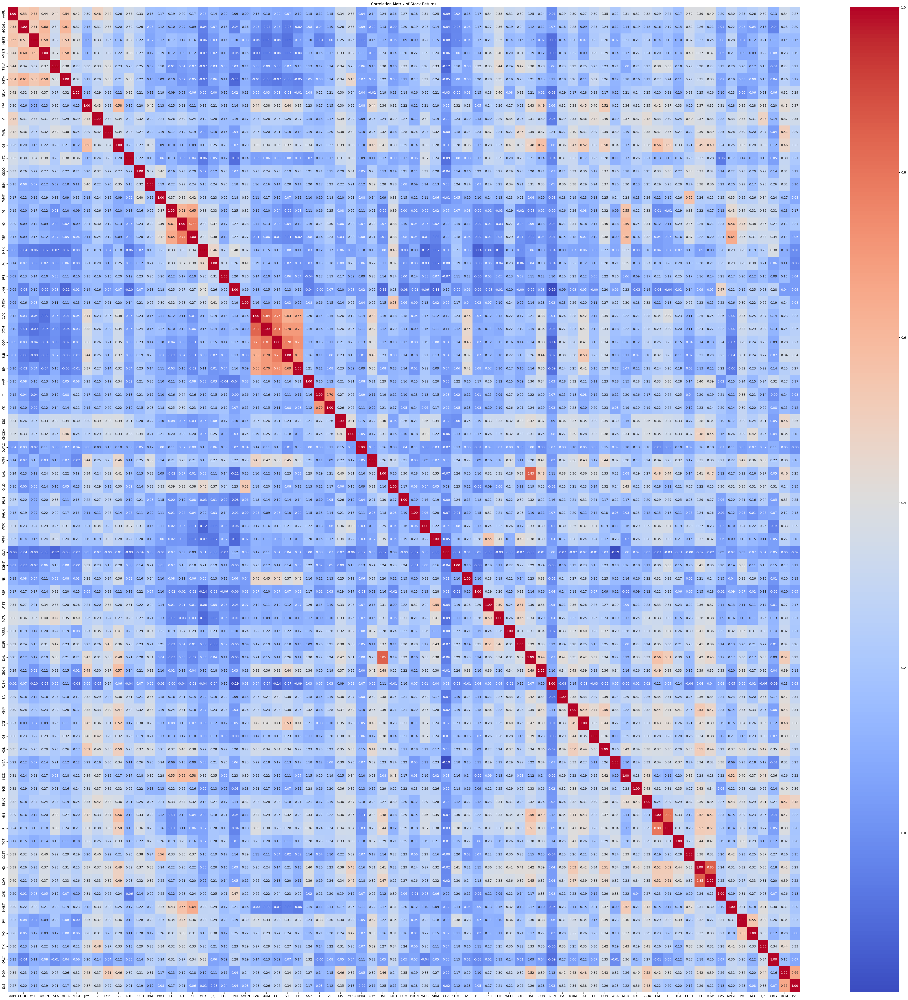

In [ ]:
import seaborn as sns
for symbol, stock_df in stock_tables.items():
    returns[symbol] = stock_df['Adj Close'].pct_change()

correlation_matrix = returns.corr()

plt.figure(figsize=(57, 57))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Stock Returns")
plt.show()

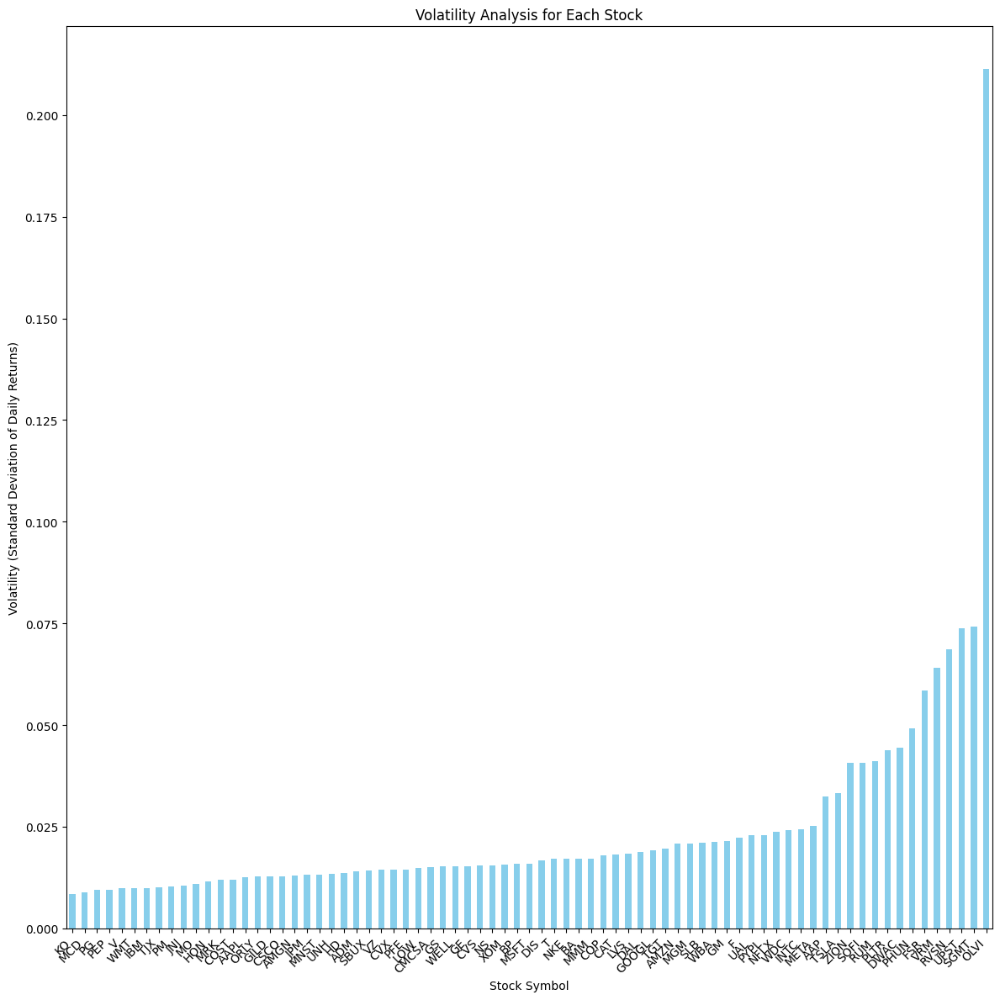

In [ ]:
returns = pd.DataFrame()
for symbol, stock_df in stock_tables.items():
    returns[symbol] = stock_df['Adj Close'].pct_change()

volatility = returns.std()

plt.figure(figsize=(12, 12))
volatility.sort_values().plot(kind='bar', color='skyblue')
plt.title('Volatility Analysis for Each Stock')
plt.xlabel('Stock Symbol')
plt.ylabel('Volatility (Standard Deviation of Daily Returns)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

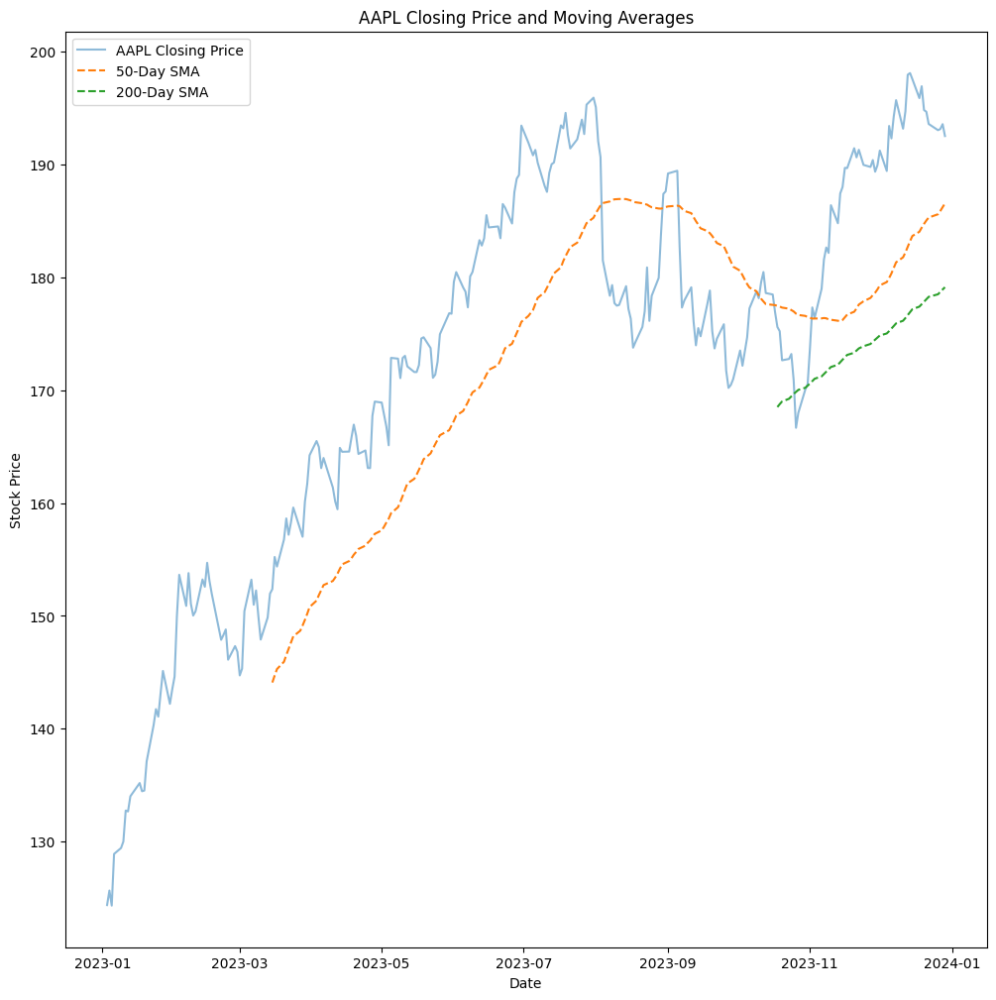

In [ ]:
closing_prices = pd.DataFrame({symbol: stock_df['Adj Close'] for symbol, stock_df in stock_tables.items()})

sma_50 = closing_prices.rolling(window=50).mean()
sma_200 = closing_prices.rolling(window=200).mean()

plt.figure(figsize=(12, 12))
plt.plot(closing_prices['AAPL'], label='AAPL Closing Price', alpha=0.5)
plt.plot(sma_50['AAPL'], label='50-Day SMA', linestyle='--')
plt.plot(sma_200['AAPL'], label='200-Day SMA', linestyle='--')
plt.title('AAPL Closing Price and Moving Averages')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

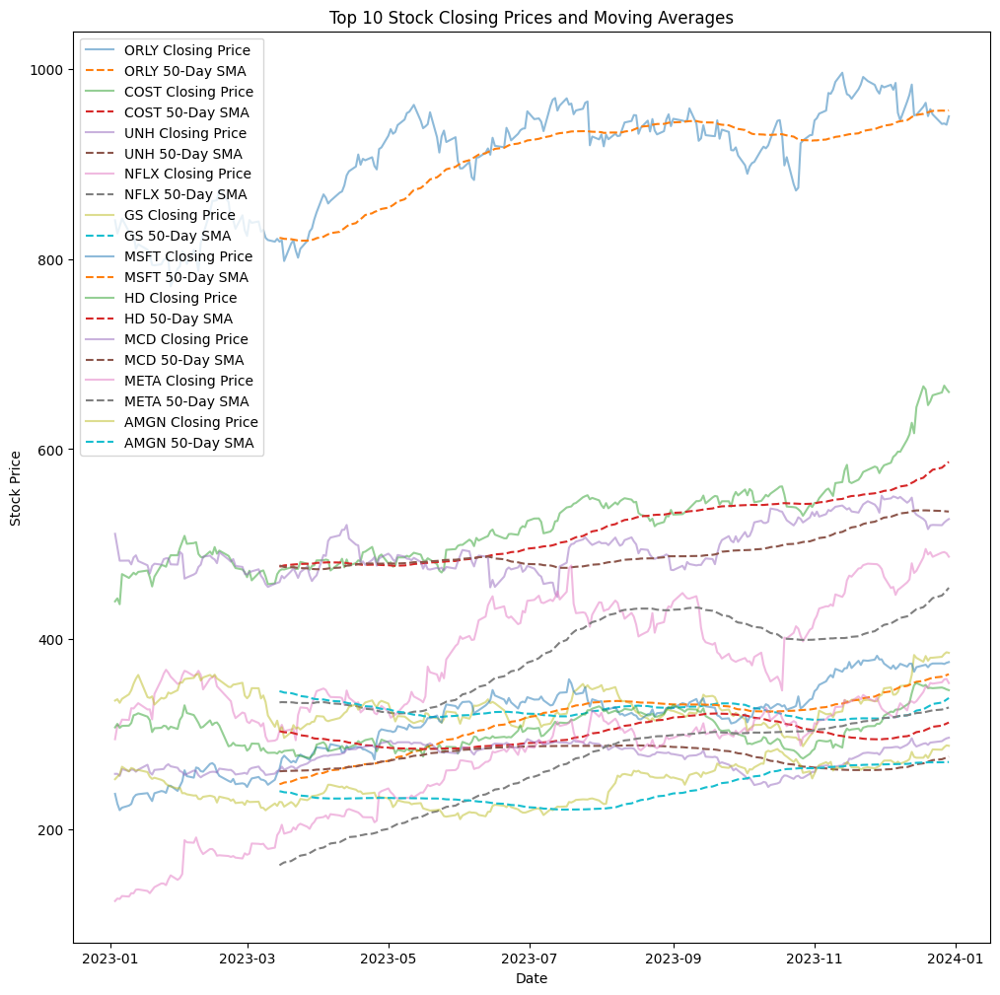

In [ ]:
closing_prices = pd.DataFrame({symbol: stock_df['Adj Close'] for symbol, stock_df in stock_tables.items()})

mean_closing_price = closing_prices.mean(axis=0)
top_stocks = mean_closing_price.nlargest(10).index

plt.figure(figsize=(12, 12))

for symbol in top_stocks:
    sma_50 = closing_prices[symbol].rolling(window=50).mean()

    plt.plot(closing_prices[symbol], label=f'{symbol} Closing Price', alpha=0.5)
    plt.plot(sma_50, label=f'{symbol} 50-Day SMA', linestyle='--')

plt.title('Top 10 Stock Closing Prices and Moving Averages')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()


Louvain Communities:
Community 1: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80]


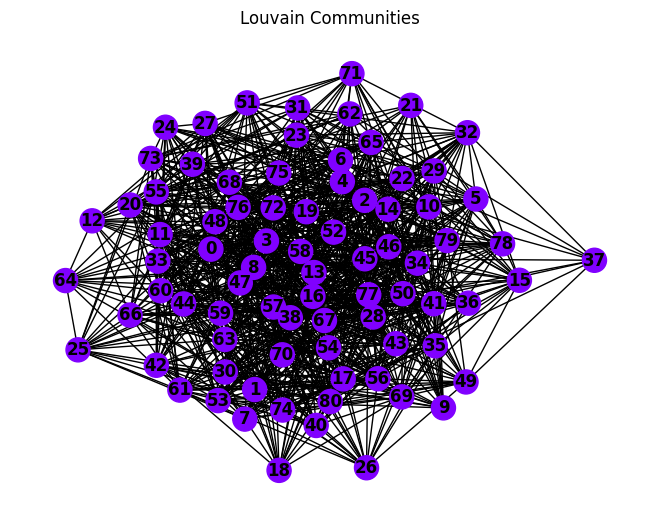

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms import community



stock_symbols = [ "PYPL","GOOGL", "MSFT", "AMZN", "TSLA", "META", "NFLX",
                 "JPM", "V", "GS", "INTC", "CSCO", "IBM", "WMT","PG", "KO", "PEP", "AAPL",
                 "MRK", "JNJ", "PFE", "UNH", "AMGN","CVX", "XOM", "COP", "SLB", "BP", "AAP",
                 "T", "VZ","DIS", "CMCSA","DWAC",	"ADM", "UAL", "GILD", "RUM","PHUN","WDC",
                 "VRM","OLVI","SGMT","NS","FSR", "UPST", "PLTR","WELL","SOFI","DAL","ZION",
                 "DIS","RVSN","BA", "MMM", "CAT", "GE", "HON", "WBA", "MCD", "NKE", "SBUX",
                 "GM", "F", "TGT", "COST", "WMT", "HD", "LOW", "CVS","KO", "PEP", "MNST",
                 "PM", "MO", "TJX", "ORLY", "MGM", "LVS" ]

G = nx.erdos_renyi_graph(len(stock_symbols), 0.3, seed=42)

louvain_communities = community.label_propagation.label_propagation_communities(G)

louvain_communities_dict = {i: list(community) for i, community in enumerate(louvain_communities)}

print("\nLouvain Communities:")
for i, community_set in louvain_communities_dict.items():
    print(f"Community {i + 1}: {community_set}")

pos = nx.spring_layout(G)
colors = [i for i, community_set in louvain_communities_dict.items() for _ in community_set]
nx.draw(G, pos, with_labels=True, font_weight='bold', node_color=colors, cmap=plt.cm.rainbow)
plt.title('Louvain Communities')
plt.show()


In [ ]:
#top_10_symbols = ["TSLA", "META","AAPL", "GOOGL", "JPM", "GS","MSFT", "AMZN", "IBM", "INTC"]
G = nx.erdos_renyi_graph(len(top_10_symbols), 0.3, seed=42)

nx.draw(G, with_labels=True, font_weight='bold')
plt.title('Clustering Coefficient')
plt.show()


clustering_coefficients = nx.clustering(G)

print("\nClustering Coefficients:")
for node, coefficient in clustering_coefficients.items():
    print(f"{node}: {coefficient}")

average_clustering_coefficient = nx.average_clustering(G)

print(f"\nAverage Clustering Coefficient: {average_clustering_coefficient}")


NameError: name 'nx' is not defined


Fraction over Median Degree:
0: 1.3333333333333333
1: 1.6666666666666667
2: 1.3333333333333333
3: 1.3333333333333333
4: 0.3333333333333333
5: 0.6666666666666666
6: 1.0
7: 1.0
8: 1.0
9: 1.6666666666666667


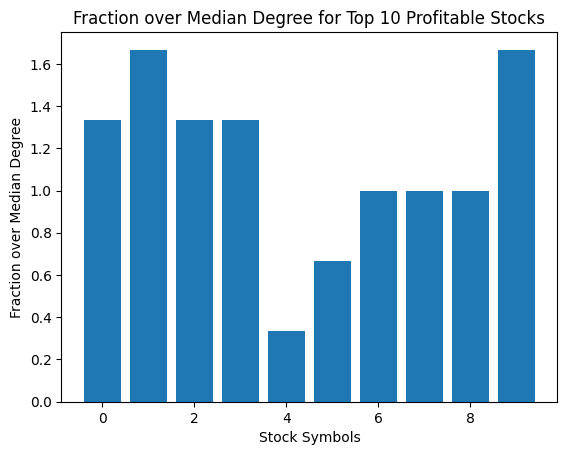

In [ ]:


G = nx.erdos_renyi_graph(len(top_10_symbols), 0.3, seed=42)

degrees = G.degree()

median_degree = nx.degree_histogram(G)[len(nx.degree_histogram(G)) // 2]

fraction_over_median_degree = {node: degree / median_degree for node, degree in degrees}

print("\nFraction over Median Degree:")
for node, fraction in fraction_over_median_degree.items():
    print(f"{node}: {fraction}")

plt.bar(fraction_over_median_degree.keys(), fraction_over_median_degree.values())
plt.xlabel('Stock Symbols')
plt.ylabel('Fraction over Median Degree')
plt.title('Fraction over Median Degree for Top 10 Profitable Stocks')
plt.show()



Conductance:
0: 1.0
1: 1.0
2: 1.0
3: 1.0
4: 1.0
5: 1.0
6: 1.0
7: 1.0
8: 1.0
9: 1.0


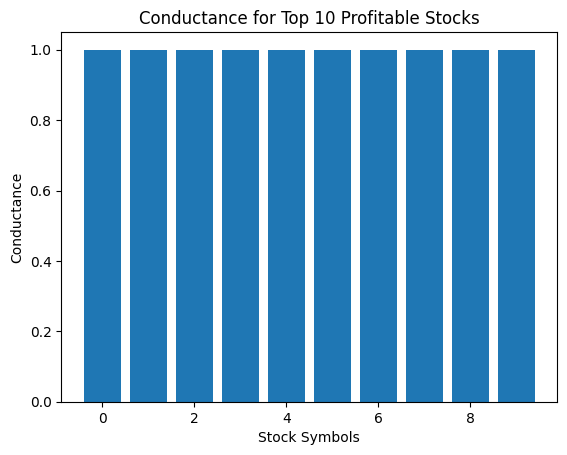

In [ ]:


G = nx.erdos_renyi_graph(len(top_10_symbols), 0.3, seed=42)

conductance = {node: nx.conductance(G, [node]) for node in G.nodes}

print("\nConductance:")
for node, cond in conductance.items():
    print(f"{node}: {cond}")

plt.bar(conductance.keys(), conductance.values())
plt.xlabel('Stock Symbols')
plt.ylabel('Conductance')
plt.title('Conductance for Top 10 Profitable Stocks')
plt.show()


Normalized Cut: 0
Cut Ratio: 0

Normalized Cut for Each Node:
0: 1.1176470588235294
1: 1.147058823529412
2: 1.1176470588235294
3: 1.1176470588235294
4: 1.0294117647058822
5: 1.0588235294117647
6: 1.088235294117647
7: 1.088235294117647
8: 1.088235294117647
9: 1.147058823529412

Cut Ratio for Each Node:
0: 1.0
1: 1.0
2: 1.0
3: 1.0
4: 1.0
5: 1.0
6: 1.0
7: 1.0
8: 1.0
9: 1.0


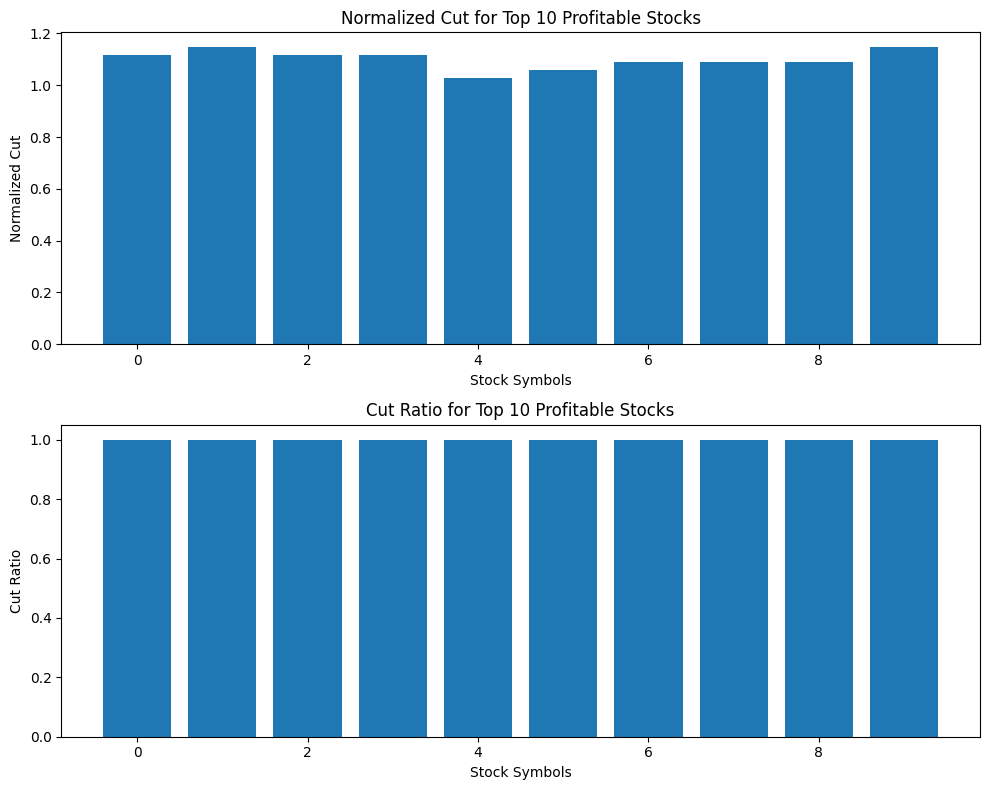

In [ ]:


G = nx.erdos_renyi_graph(len(top_10_symbols), 0.3, seed=42)

S = set(G.nodes)
T = set()
if len(S) > 0 and len(G.nodes) - len(S) > 0:
    normalized_cut = nx.normalized_cut_size(G, S, T)
    cut_ratio = nx.cut_size(G, S, T) / len(G.edges)
else:
    normalized_cut = 0
    cut_ratio = 0

print(f"Normalized Cut: {normalized_cut}")
print(f"Cut Ratio: {cut_ratio}")

normalized_cut_nodes = {node: nx.normalized_cut_size(G, {node}, S) for node in G.nodes}
cut_ratio_nodes = {node: nx.cut_size(G, {node}, S) / G.degree(node) for node in G.nodes}

print("\nNormalized Cut for Each Node:")
for node, nc in normalized_cut_nodes.items():
    print(f"{node}: {nc}")

print("\nCut Ratio for Each Node:")
for node, cr in cut_ratio_nodes.items():
    print(f"{node}: {cr}")

fig, axs = plt.subplots(2, 1, figsize=(10, 8))
axs[0].bar(normalized_cut_nodes.keys(), normalized_cut_nodes.values())
axs[0].set_xlabel('Stock Symbols')
axs[0].set_ylabel('Normalized Cut')
axs[0].set_title('Normalized Cut for Top 10 Profitable Stocks')

axs[1].bar(cut_ratio_nodes.keys(), cut_ratio_nodes.values())
axs[1].set_xlabel('Stock Symbols')
axs[1].set_ylabel('Cut Ratio')
axs[1].set_title('Cut Ratio for Top 10 Profitable Stocks')

plt.tight_layout()
plt.show()


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Volatility for Each Stock:
AAPL     0.012566
GOOGL    0.019149
MSFT     0.015832
AMZN     0.020805
TSLA     0.033166
META     0.025090
JPM      0.013132
GS       0.015250
IBM      0.010179
INTC     0.024343
dtype: float64


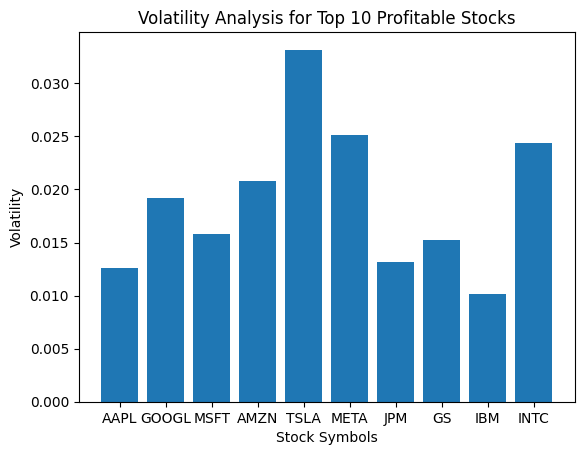

In [ ]:
import yfinance as yf


historical_prices = pd.DataFrame()
start_date="2023-01-01"
end_date="2024-01-01"
for symbol in top_10_symbols:
    stock_data = yf.download(symbol, start=start_date, end=end_date)
    historical_prices[symbol] = stock_data['Close']

returns = historical_prices.pct_change().dropna()

volatility = returns.std()

print("Volatility for Each Stock:")
print(volatility)

plt.bar(volatility.index, volatility.values)
plt.xlabel('Stock Symbols')
plt.ylabel('Volatility')
plt.title('Volatility Analysis for Top 10 Profitable Stocks')
plt.show()


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


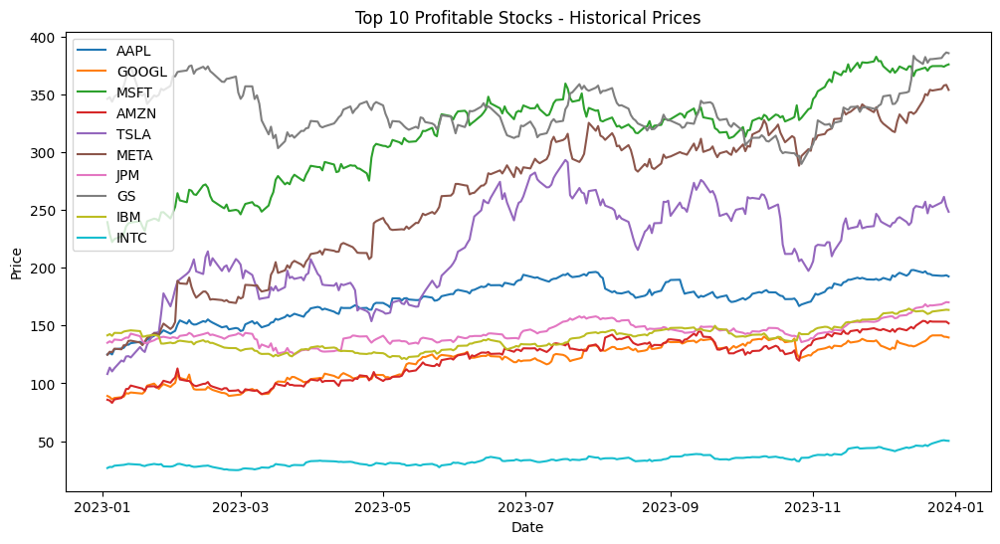

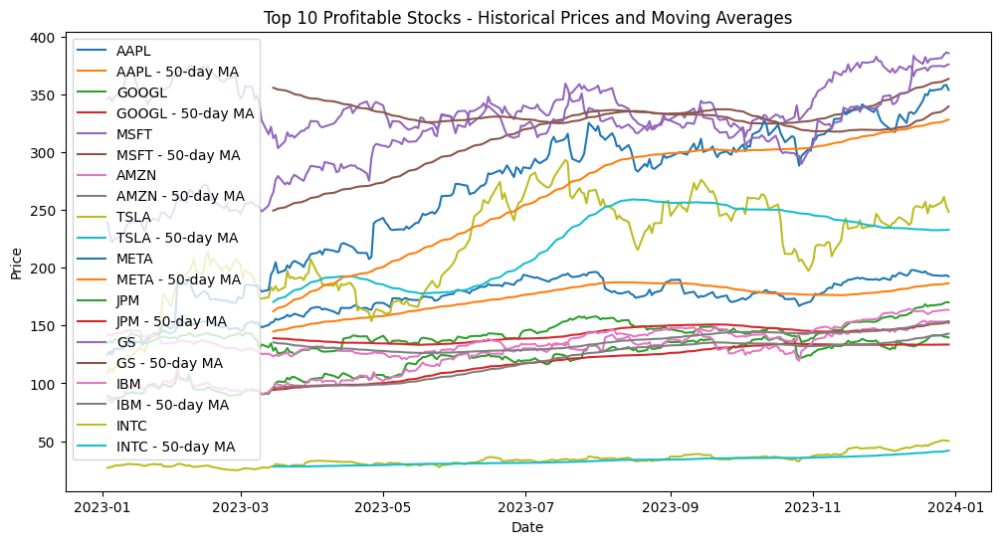

In [ ]:



historical_prices = pd.DataFrame()

for symbol in top_10_symbols:
    stock_data = yf.download(symbol, start=start_date, end=end_date)
    historical_prices[symbol] = stock_data['Close']

moving_average_50 = historical_prices.rolling(window=50).mean()

plt.figure(figsize=(12, 6))

for symbol in top_10_symbols:
    plt.plot(historical_prices.index, historical_prices[symbol], label=symbol)

plt.title('Top 10 Profitable Stocks - Historical Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()

plt.figure(figsize=(12, 6))

for symbol in top_10_symbols:
    plt.plot(historical_prices.index, historical_prices[symbol], label=symbol)
    plt.plot(moving_average_50.index, moving_average_50[symbol], label=f'{symbol} - 50-day MA')

plt.title('Top 10 Profitable Stocks - Historical Prices and Moving Averages')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()

plt.show()
